In [179]:
# !pip3 uninstall --yes torch torchaudio torchvision torchtext torchdata
# !pip3 install torch torchaudio torchvision torchtext torchdata
# !pip3 uninstall --yes pandas
# !pip3 install pandas

#!nvidia-smi

In [259]:
%load_ext autoreload
%autoreload 2

# data processing
import torch.nn.functional as F
import pandas as pd
import numpy as np
from datetime import datetime
from datetime import timedelta

# plotting
import seaborn as sns
import matplotlib.pyplot as plt

# Statistics (correlation)
from scipy.stats import pearsonr, spearmanr

# libraries for the model
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, TensorDataset

from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [181]:
# Custom functions
from pt_helpers import *

In [182]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cpu')

## Load the training data
This is the clean data that we processed in the notebook `Training_data_preparation`

In [183]:
data_path = "DATA/training_data/"
df = pd.read_csv(data_path+"VEX_edac_mag_labeled_15min_nan.csv")
df_brut = df.copy()
df['DATE_TIME'] = pd.to_datetime(df['DATE_TIME'])
df.set_index('DATE_TIME', drop=True, inplace=True)
df

,EDAC,BX,BY,BZ,BT,XSC,YSC,ZSC,RSC,cme
DATE_TIME,,,,,,,,,,
2006-04-24 00:00:00,0.0,12.694681,-1.052317,-3.393443,13.192446,-4202.433929,-3138.365649,-65803.675632,66012.817264,0.0
2006-04-24 00:15:00,0.0,12.742658,-0.851723,-2.451964,13.028579,-3454.070724,-2962.592922,-66781.893155,66937.180418,0.0
2006-04-24 00:30:00,0.0,12.129702,-2.380009,-2.083976,12.556213,-2701.520212,-2784.402706,-67702.788067,67814.263056,0.0
2006-04-24 00:45:00,0.0,12.007129,-3.004262,-1.358511,12.458044,-1947.950560,-2604.619218,-68564.876582,68642.370787,0.0
2006-04-24 01:00:00,0.0,11.646951,-3.502289,-1.129547,12.218533,-1192.234280,-2423.042062,-69371.695791,69424.619111,0.0
...,...,...,...,...,...,...,...,...,...,...
2014-11-27 14:45:00,0.0,9.701000,-4.397880,-1.505907,11.049280,-10899.035293,-7293.041813,-65573.405947,66871.932227,0.0
2014-11-27 15:00:00,0.0,9.701000,-4.397880,-1.505907,11.049280,-10899.035293,-7293.041813,-65573.405947,66871.932227,0.0
2014-11-27 15:15:00,0.0,9.701000,-4.397880,-1.505907,11.049280,-10899.035293,-7293.041813,-65573.405947,66871.932227,0.0


We separate the feature matrix `X` and the labels `y`.
- `X` will contain X Y and Z coordinates of the magnetic field

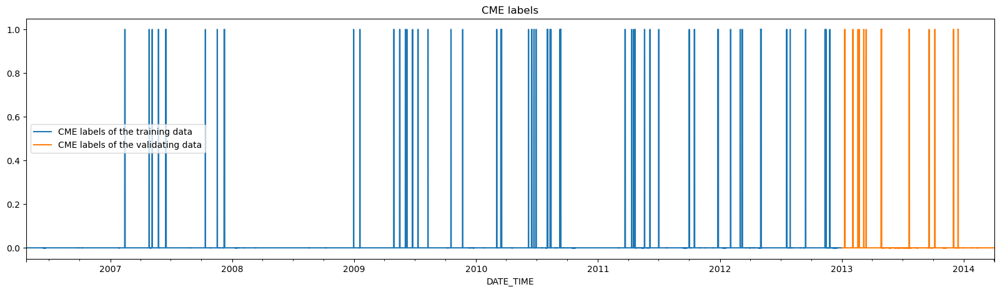

In [184]:
df_train = df.loc[:'2012-12-31'].copy()
df_test = df.loc['2013-01-01':'2014-04-01'].copy()

features = ['BX', 'BY', 'BZ', 'RSC']
label_feature = 'cme'

_, ax = plt.subplots(figsize=(20, 5))
df_train[label_feature].plot(ax=ax, label="CME labels of the training data")
df_test[label_feature].plot(ax=ax, label="CME labels of the validating data")
plt.title("CME labels")
plt.legend()
plt.show()

In [185]:
# Create the feature matrix and the labels
y_tr = df_train[label_feature].values
X_tr = df_train[features].values
y_te = df_test[label_feature].values
X_te = df_test[features].values

# Standardize the data
scaler = StandardScaler()
X_tr = scaler.fit_transform(X_tr)
X_te = scaler.transform(X_te)

print("Shape of y:", y_tr.shape)
print("Shape of X:", X_tr.shape)
print("Shape of y_test:", y_te.shape)
print("Shape of X_test:", X_te.shape)

Shape of y: (234624,)
Shape of X: (234624, 4)
Shape of y_test: (43776,)
Shape of X_test: (43776, 4)


## LSTM

In [186]:
time_steps = 36 // 2   # 6 hours of data
n_features = len(features) # Number of features
X_train, y_train = create_sequences_without_nan(X_tr, y_tr, time_steps)
X_val, y_val = create_sequences_without_nan(X_te, y_te, time_steps)
print(X_train.shape, y_train.shape)
print(X_val.shape, y_val.shape)

y_train = (y_train > 0.5).astype(int)
y_val = (y_val > 0.5).astype(int)

print("Check for NaNs:")
print(np.isnan(X_train).sum())
print(np.isnan(X_val).sum())

(232610, 18, 4) (232610,)
(43258, 18, 4) (43258,)
Check for NaNs:
0
0


In [187]:
def create_data_loader(X, y, batch_size, shuffle=False):
    dataset = TensorDataset(torch.tensor(X, dtype=torch.float32).to(device), torch.tensor(y, dtype=torch.float32).to(device))
    return DataLoader(dataset, batch_size=batch_size, shuffle=shuffle)


# Create DataLoaders
batch_size = 128  # Adjust this based on your system's capability
train_loader = create_data_loader(X_train, y_train, batch_size, shuffle=True)
val_loader = create_data_loader(X_val, y_val, batch_size)

In [188]:
class CMEPredictor(nn.Module):
    def __init__(self, n_features, n_hidden=50, n_layers=1, dropout=0.0):
        super(CMEPredictor, self).__init__()
        self.lstm = nn.LSTM(input_size=n_features, hidden_size=n_hidden, num_layers=n_layers, batch_first=True, dropout=dropout)
        self.linear = nn.Linear(n_hidden, 1)

    def forward(self, x):
        x, _ = self.lstm(x)
        x = self.linear(x[:, -1, :])
        return torch.sigmoid(x)

model = CMEPredictor(n_features, 5, 2, dropout=0.2).to(device)
w_model = CMEPredictor(n_features, 5, 2, dropout=0.2).to(device)

# Training parameters

In [189]:
criterion = nn.BCELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
n_epochs = 10

### Training and evaluation

In [219]:
threshold = 0.5 # Using 0.5 as the threshold for binary classification, if larger than 1-0.5, then classified as a CME

def evaluate_model(model, data_loader):
    model.eval()
    predictions = []
    true_labels = []
    with torch.no_grad():
        for X_batch, y_batch in data_loader:
            outputs = model(X_batch)
            predicted = (outputs > threshold).float()  
            predictions.extend(predicted.view(-1).tolist())
            true_labels.extend(y_batch.tolist())

    # Calculate metrics
    accuracy = accuracy_score(true_labels, predictions)
    f1 = f1_score(true_labels, predictions)
    precision = precision_score(true_labels, predictions)
    recall = recall_score(true_labels, predictions)

    print(f'Accuracy: {accuracy}')
    print(f'F1 Score: {f1}')
    print(f'Precision: {precision}')
    print(f'Recall: {recall}')

In [191]:
def train_model(model, train_loader, eval_loader, criterion, optimizer, n_epochs):
    loss = -1
    for epoch in range(n_epochs):
        model.train()
        for X_batch, y_batch in train_loader:
            optimizer.zero_grad()
            output = model(X_batch)
            loss = criterion(output, y_batch.view(-1, 1))
            loss.backward()
            optimizer.step()

        # Validation
        model.eval()
        with torch.no_grad():
            val_loss = 0
            for X_batch, y_batch in eval_loader:
                val_output = model(X_batch)
                val_loss += criterion(val_output, y_batch.view(-1, 1)).item()
        val_loss /= len(eval_loader)
        print(f'Epoch {epoch+1}, Loss: {loss.item()}, Val Loss: {val_loss}')

In [192]:
# train_model(model, train_loader, val_loader, criterion, optimizer, n_epochs)

In [193]:
print("Train")
# evaluate_model(model, train_loader)
print()
print("Eval")
# evaluate_model(model, val_loader)

Train

Eval


## Cross Validation

In [260]:
# Create a time series cross-validation splitter
tscv = TimeSeriesSplit(n_splits=5)

X = df[features]
y = df[label_feature]

# Perform time series cross-validation and print the results
for train_index, test_index in tscv.split(X):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    #model.train_model(X_train, y_train)

    #y_pred = model.evaluate_model(X_test)

## LSTM with class weights

In [194]:
optimizer = optim.Adam(w_model.parameters(), lr=0.001)
class_weights = compute_class_weight(class_weight='balanced', classes=np.unique(y_train), y=y_train)
class_weights = torch.tensor(class_weights, dtype=torch.float32).to(device)
print(class_weights)

criterion = nn.BCELoss(weight=class_weights[1])  # Use the class weights in your loss function

tensor([ 0.5092, 27.6456])


In [195]:
train_model(w_model, train_loader, val_loader, criterion, optimizer, n_epochs)

Epoch 1, Loss: 1.1294907331466675, Val Loss: 2.5063966189968516
Epoch 2, Loss: 2.86482572555542, Val Loss: 2.392366203374764
Epoch 3, Loss: 0.4929310977458954, Val Loss: 2.3615331512671958
Epoch 4, Loss: 4.6977128982543945, Val Loss: 2.3687791911852076
Epoch 5, Loss: 0.18335643410682678, Val Loss: 2.3531993855915125
Epoch 6, Loss: 0.3250395953655243, Val Loss: 2.3623653500721122
Epoch 7, Loss: 9.634788513183594, Val Loss: 2.385120075262157
Epoch 8, Loss: 0.6602924466133118, Val Loss: 2.4045092749723493
Epoch 9, Loss: 0.1402260959148407, Val Loss: 2.4034903467186455
Epoch 10, Loss: 0.31594300270080566, Val Loss: 2.369102287409309


In [196]:
print("Train")
evaluate_model(w_model, train_loader)
print()
print("Eval")
evaluate_model(w_model, val_loader)

Train
Accuracy: 0.9839344826103779
F1 Score: 0.37224928607424823
Precision: 0.6345933562428407
Recall: 0.26337057285476584

Eval
Accuracy: 0.9729067455730732
F1 Score: 0.2059620596205962
Precision: 0.41081081081081083
Recall: 0.13743218806509946


In [197]:
# Plot the predictions
eval_loader = val_loader
eval_model = w_model

eval_model.eval()

predictions = []
true_labels = []
with torch.no_grad():
    val_loss = 0
    for X_batch, y_batch in eval_loader:
        val_output = eval_model(X_batch)
        predictions.extend(val_output.view(-1).tolist())
        true_labels.extend(y_batch.tolist())
print(predictions)

[0.0028756968677043915, 0.004542399663478136, 0.004721216391772032, 0.004291890654712915, 0.004260388668626547, 0.0036924828309565783, 0.002922207349911332, 0.002435951726511121, 0.002150830579921603, 0.0019714676309376955, 0.0018638124456629157, 0.0017767153913155198, 0.0016779956640675664, 0.0015557322185486555, 0.0014696178259328008, 0.001398684224113822, 0.0013495242455974221, 0.0013107025297358632, 0.001288734725676477, 0.0012681838124990463, 0.001247816369868815, 0.0012279932852834463, 0.0012111719697713852, 0.0012097100261598825, 0.0012062173336744308, 0.001201569102704525, 0.001224246108904481, 0.0012491595698520541, 0.0012775023933500051, 0.0013183929258957505, 0.001380847068503499, 0.0014291281113401055, 0.0014799732016399503, 0.0015667800325900316, 0.001662968541495502, 0.0017515260260552168, 0.0018316844943910837, 0.001900890376418829, 0.0019458113238215446, 0.0019658051896840334, 0.00198896462097764, 0.002014961326494813, 0.0020263532642275095, 0.0020233988761901855, 0.002

In [198]:
X_after = X_val[:, 0, :]
df_pred = pd.DataFrame({'pred': predictions, 'true': true_labels, 'BX': X_after[:, 0], 'BY': X_after[:, 1], 'BZ': X_after[:, 2]})
df_pred['pred_label'] = (df_pred['pred'] > 0.5).astype(int)

C:\Users\nasta\AppData\Local\Temp\ipykernel_12268\385703723.py:4: RuntimeWarning: invalid value encountered in divide
  f1 = 2 * precision * recall / (precision + recall)


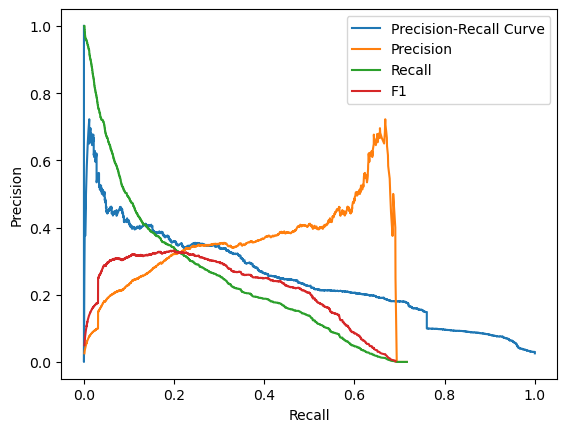

[0. 0. 0. ... 0. 0. 0.]
Accuracy: 0.9729067455730732
F1 Score: 0.2059620596205962
Precision: 0.41081081081081083
Recall: 0.13743218806509946


In [199]:
# Plot recall precision curve
from sklearn.metrics import precision_recall_curve
precision, recall, thresholds = precision_recall_curve(df_pred['true'], df_pred['pred'])
f1 = 2 * precision * recall / (precision + recall)
plt.plot(recall, precision, label="Precision-Recall Curve")
plt.plot(thresholds, precision[:-1], label="Precision")
plt.plot(thresholds, recall[:-1], label="Recall")
plt.plot(thresholds, f1[:-1], label='F1')
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend()
plt.show()

true_labels = df_pred['true'].values
pred = df_pred['pred_label'].values

print(true_labels)
accuracy = accuracy_score(true_labels, pred)
f1 = f1_score(true_labels, pred)
precision = precision_score(true_labels, pred)
recall = recall_score(true_labels, pred)

print(f'Accuracy: {accuracy}')
print(f'F1 Score: {f1}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')

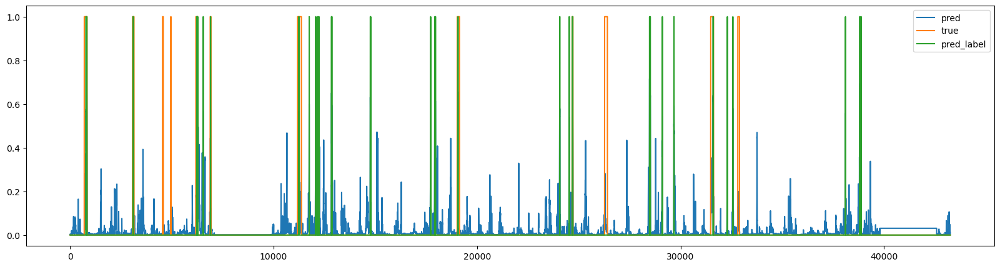

In [200]:
df_pred[['pred', 'true', 'pred_label']].plot(figsize=(20, 5))
plt.show()

In [201]:
df_train_brut = df_brut.loc[df_brut["DATE_TIME"] < '2013-01-01'].copy()
df_test_brut = df_brut.loc[df_brut["DATE_TIME"] >= '2013-01-01'].copy()
df_test_brut = df_test_brut.loc[df_test_brut["DATE_TIME"] < '2014-04-02']
df_test_brut = df_test_brut.reset_index(drop=True)

# Show some CME
mag_names = ['BX', 'BY', 'BZ']
pred_names = ['pred', 'true', 'pred_label']

df_pred_plot = df_pred.copy()
df_pred_plot[pred_names] *= 5

#display(df_pred_plot.head())
display(df_test_brut.shape)
display(df_test.shape)

df_test_brut = df_test_brut['DATE_TIME']
df_pred_plot = df_pred_plot.merge(df_test_brut, left_index=True, right_index=True)
df_pred_plot['DATE_TIME'] = pd.to_datetime(df_pred_plot['DATE_TIME'])
df_pred_plot.set_index('DATE_TIME', inplace=True, drop=True)
display(df_pred_plot.head())


(43776, 11)

(43776, 10)

,pred,true,BX,BY,BZ,pred_label
DATE_TIME,,,,,,
2013-01-01 00:00:00,0.014378,0.0,0.081355,0.877723,0.049835,0
2013-01-01 00:15:00,0.022712,0.0,0.249200,0.759572,0.453008,0
2013-01-01 00:30:00,0.023606,0.0,0.043966,0.805698,0.707006,0
2013-01-01 00:45:00,0.021459,0.0,-0.401459,0.442388,1.263749,0
2013-01-01 01:00:00,0.021302,0.0,-0.461757,0.351024,1.276364,0


<Axes: xlabel='DATE_TIME'>

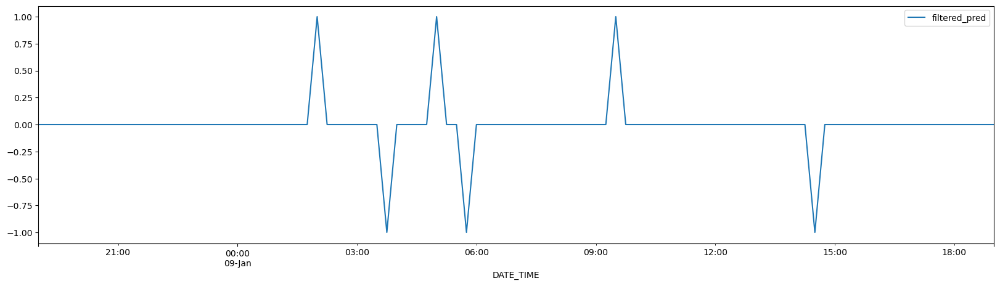

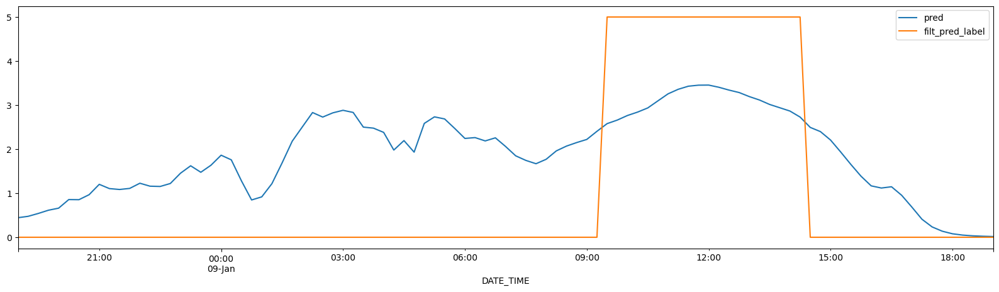

In [218]:
df_pred_plot['filtered_pred'] = df_pred_plot['pred_label'].diff() / 5 # 1 for begining of CME & -1 for end of CME
df_pred_plot[['filtered_pred']].loc['2013-01-08 19:00:00':'2013-01-09 19:00:00'].plot(figsize=(20, 5))

start_pred_df = df_pred_plot[df_pred_plot['filtered_pred'] == 1].copy() # put all the start of CME date in a dataframe
start_pred_df.reset_index(drop=False, inplace=True)
start_pred_df.rename(columns={'DATE_TIME': 'start_date'}, inplace=True)
start_pred_df = start_pred_df[['start_date']]
end_pred_df = df_pred_plot[df_pred_plot['filtered_pred'] == -1].copy() # put all the end of CME date in a dataframe
end_pred_df.reset_index(drop=False, inplace=True)
end_pred_df.rename(columns={'DATE_TIME': 'end_date'}, inplace=True)
end_pred_df = end_pred_df[['end_date']]

length_pred_df = start_pred_df.merge(end_pred_df, left_index=True, right_index=True)

length_pred_df['start_date'] = pd.to_datetime(length_pred_df['start_date'])
length_pred_df['end_date'] = pd.to_datetime(length_pred_df['end_date'])
time_difference = length_pred_df['end_date'] - length_pred_df['start_date']
length_pred_filt_df = length_pred_df[time_difference >= pd.Timedelta(hours=2)] # Keep only the CME prediction with a duration of at least 2 hours

df_pred_plot['filt_pred_label'] = 0

for index, row in length_pred_filt_df.iterrows():
    mask_start = df_pred_plot.index == row['start_date'] # keep only the filtered CME prediction
    mask_end = df_pred_plot.index == row['end_date']
    df_pred_plot.loc[mask_start, 'filt_pred_label'] = 5
    df_pred_plot.loc[mask_end, 'filt_pred_label'] = -5

df_pred_plot['filt_pred_label'] = df_pred_plot['filt_pred_label'].cumsum()

#display(df_pred_plot.head())
df_pred_plot[['pred', 'filt_pred_label']].loc['2013-01-08 19:00:00':'2013-01-09 19:00:00'].plot(figsize=(20, 5))

<Axes: xlabel='DATE_TIME'>

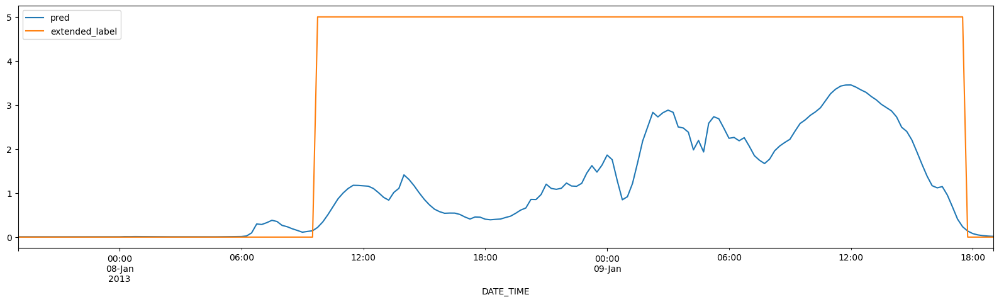

In [256]:
df_pred_plot['extended_label'] = 0

expanding_window = False
current_window_start = 0

for index, row in df_pred_plot.iterrows():
    if row['filt_pred_label'] == 5:
        expanding_window = True
        current_window_start = index

    if expanding_window and row['pred'] > 0.2:
        df_pred_plot.loc[current_window_start:index, 'extended_label'] = 5
    else:
        expanding_window = False


expanding_window = False
current_window_start = 0

for index, row in df_pred_plot.iloc[::-1].iterrows():
    if row['filt_pred_label'] == 5:
        expanding_window = True
        current_window_start = index

    if expanding_window and row['pred'] > 0.2:
        df_pred_plot.loc[index:current_window_start, 'extended_label'] = 5
    else:
        expanding_window = False

        
df_pred_plot[['pred', 'extended_label']].loc['2013-01-07 19:00:00':'2013-01-09 19:00:00'].plot(figsize=(20, 5))

In [257]:
pred = df_pred_plot['extended_label'].values / 5

accuracy = accuracy_score(true_labels, pred)
f1 = f1_score(true_labels, pred)
precision = precision_score(true_labels, pred)
recall = recall_score(true_labels, pred)

print(f'Accuracy: {accuracy}')
print(f'F1 Score: {f1}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')

Accuracy: 0.9727680429053586
F1 Score: 0.485589519650655
Precision: 0.46959459459459457
Recall: 0.5027124773960217


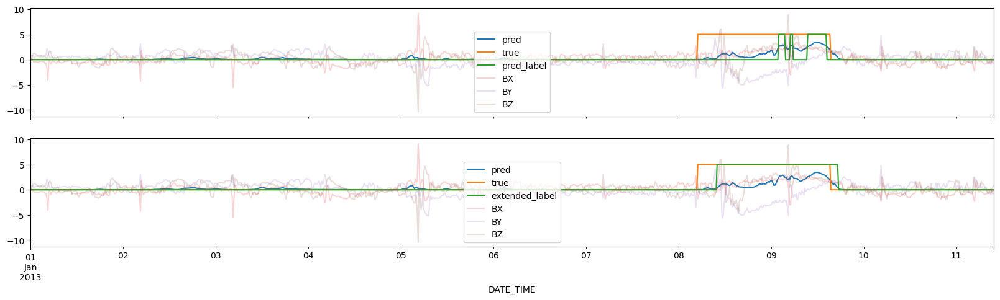

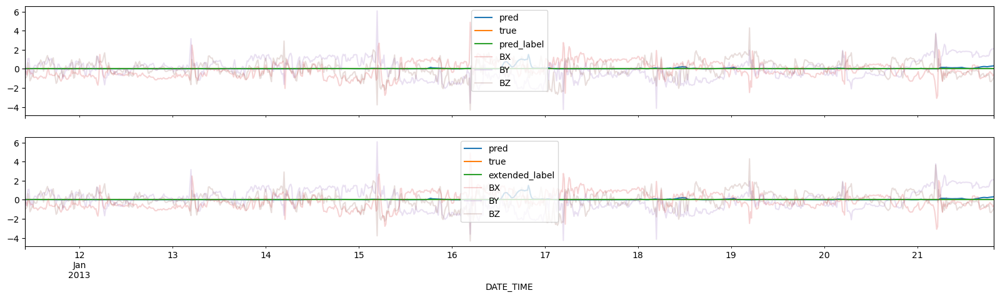

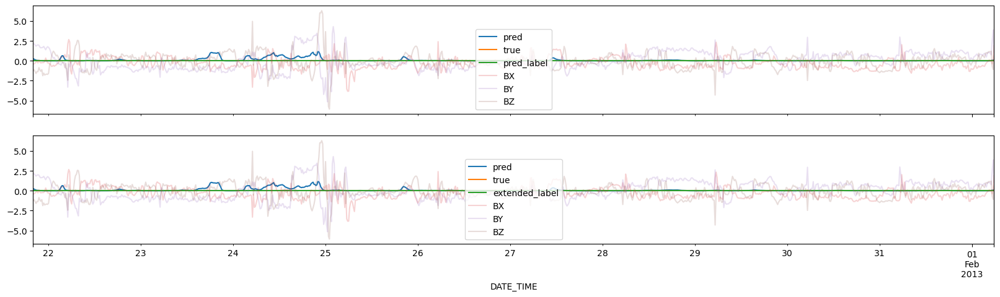

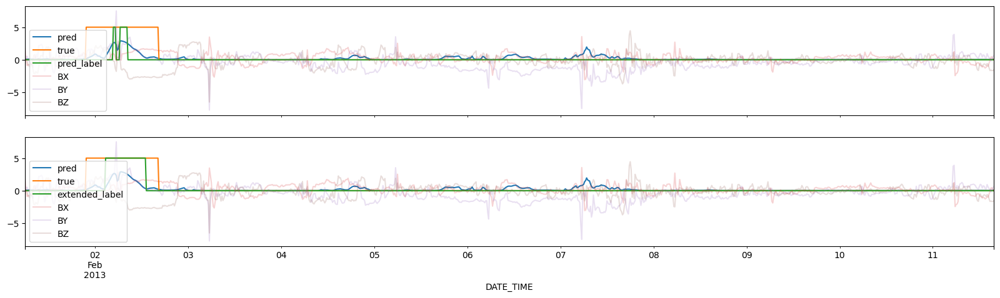

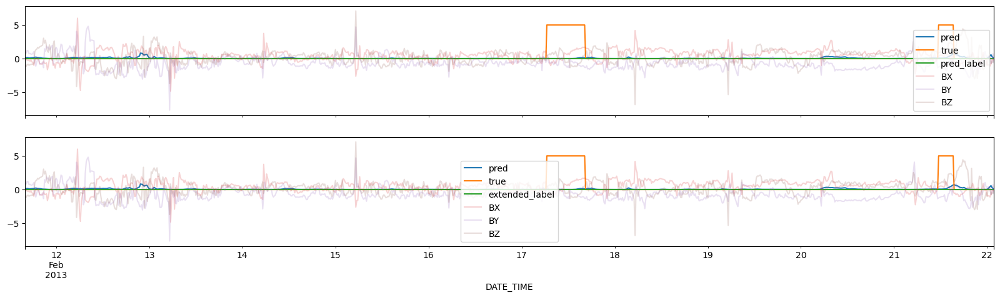

...

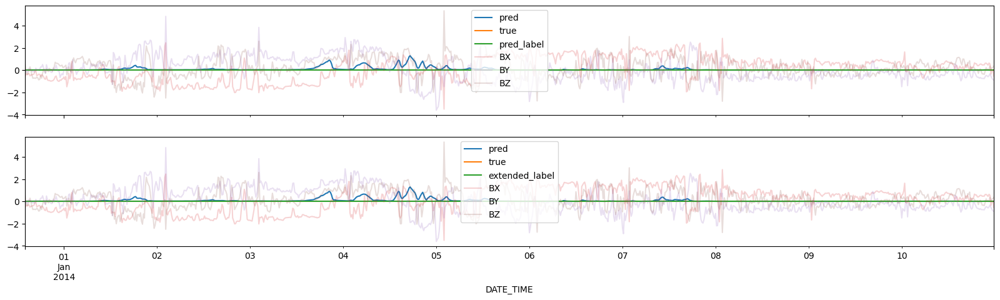

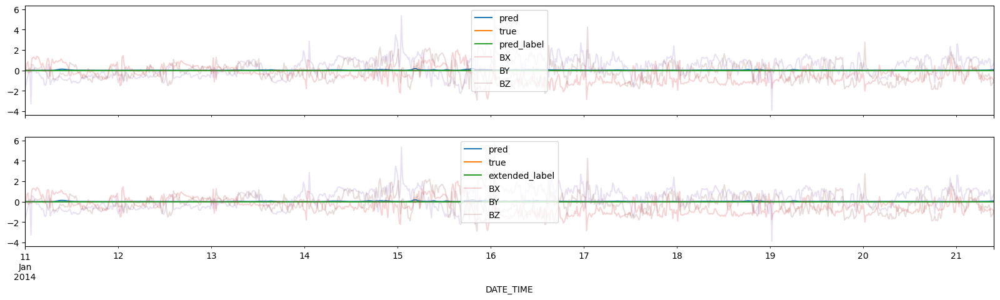

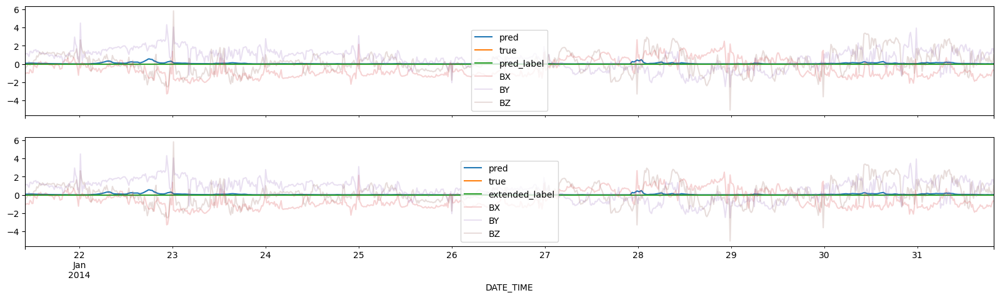

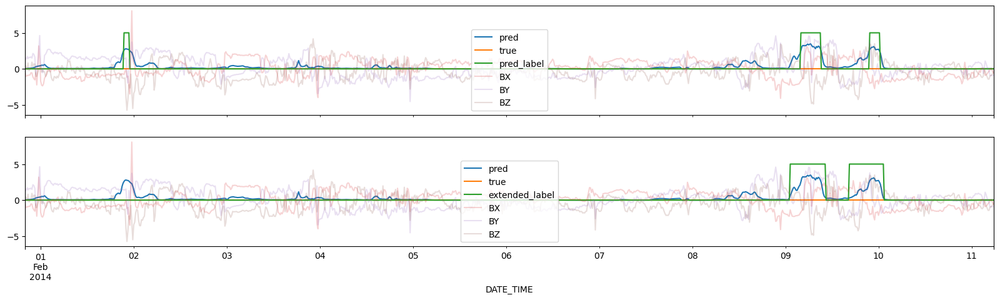

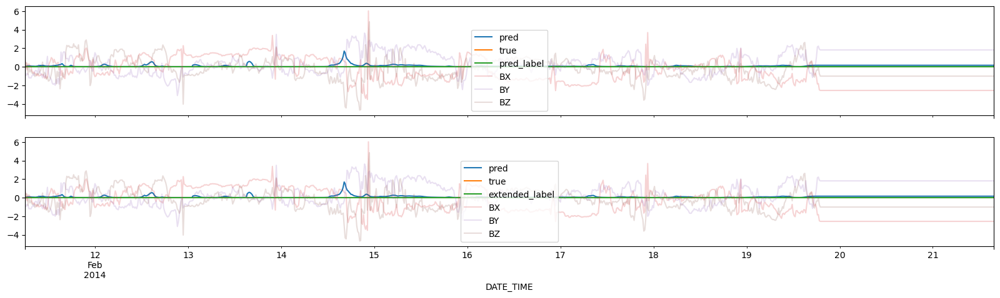

In [241]:
for i in range(0, 40):
    fig, (pA, pB) = plt.subplots(2, figsize=(20, 5), sharex=True)
    df_pred_plot[['pred', 'true', 'pred_label']].iloc[i*1000:(i+1)*1000].plot(ax=pA)
    df_pred_plot[['BX', 'BY', 'BZ']].iloc[i*1000:(i+1)*1000].plot(ax=pA, alpha=0.2)
    df_pred_plot[['pred', 'true', 'extended_label']].iloc[i*1000:(i+1)*1000].plot(ax=pB)
    df_pred_plot[['BX', 'BY', 'BZ']].iloc[i*1000:(i+1)*1000].plot(ax=pB, alpha=0.2)
    plt.show()